This notebook contains code written in VS code that was used to produce the moving timelapses of cloud data during the initial exploration of the COGS files.

In [ ]:
#import libraries for analysing the data
from netCDF4 import Dataset
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from datetime import datetime
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import PIL
import warnings

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
file_path = "/content/gdrive/MyDrive/Colab Notebooks/Data/"

In [ ]:
file_name ='sgpcogspiN1.c1.20180206.143820.nc'
#read in the cloud data file
cloud_data_set = Dataset(file_path + file_name, mode='r')

We can plot the meta data for the cloud data file to view how the data is formatted

In [ ]:
#set the Boolean to True to print metadata for the cloud dataset
print_ds_metadata = False
if print_ds_metadata:
    print(cloud_data_set)

We convert the variables into NumPy arrays for use in Python code

In [ ]:
#extract variables x,y,z,cloud and time as numpy arrays
#extracting variables as numpy arrays causes a deprication warning
#so we suppress the deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
x = np.array(cloud_data_set.variables['x'])
y = np.array(cloud_data_set.variables['y'])
z = np.array(cloud_data_set.variables['z'])
cloud = np.array(cloud_data_set.variables['cloud'])
time = np.array(cloud_data_set.variables['time'])
#turn deprecation warnings back on
warnings.filterwarnings("default", category=DeprecationWarning) 

In [ ]:
#if metadata required (see above), print out sizes of the variables
if print_ds_metadata:
    print('x shape is: ',np.shape(x))
    print('y shape is: ',np.shape(y))
    print('z shape is: ',np.shape(z))
    print('time shape is: ',np.shape(time))
    print('cloud shape is: ',np.shape(cloud))

In [ ]:
#set the range of time indices to include, with a stride if required
time_range = np.arange(0,time.size,1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


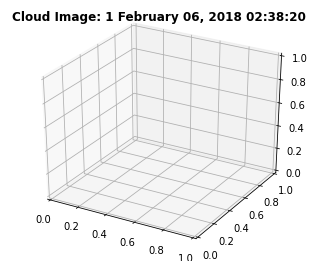

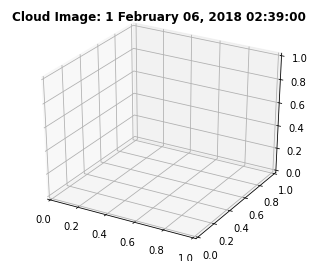

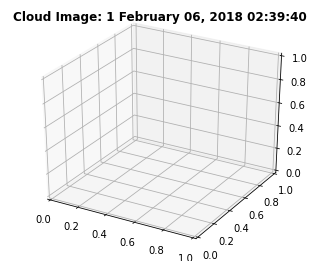

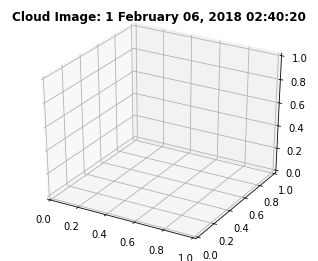

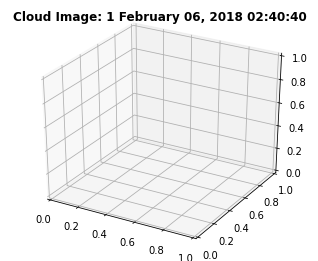

...

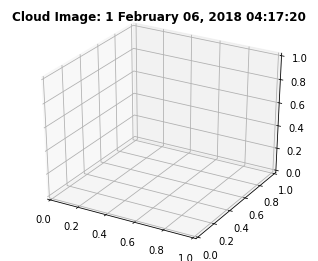

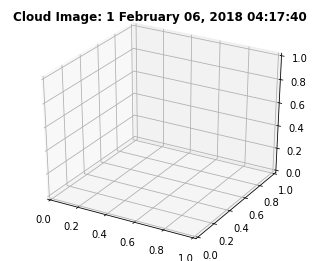

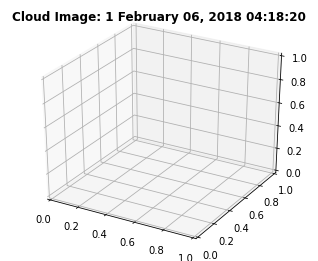

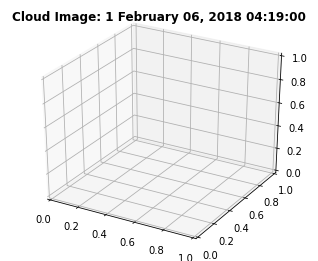

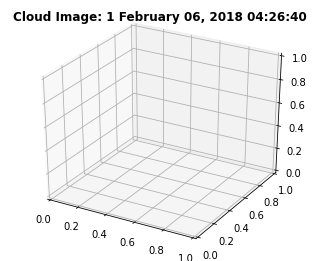

In [ ]:
#iterate through each time point and plot the cloud
image_number=0
for t_index in time_range:
    fig = plt.figure(figsize = (12, 10))
    ax = fig.add_subplot(2,2,1,projection='3d')
    #show the date and time as the plot title
    plot_title = 'Cloud Image: ' + str(image_number+1)
    plot_title = plot_title + ' ' + datetime.fromtimestamp(time[t_index]).strftime("%B %d, %Y %I:%M:%S")
    ax.set_title(plot_title, fontweight ='bold')
    #obtain the cloud matrix indices for positive elements (which correspond to positions with cloud)
    #1 => cloud, 0 => no cloud and -1 => no cloud reconstruction
    zt,yt,xt = np.where(cloud[t_index,:,:,:]>0)
    #compute the amount of cloud in each vertical direction (which contains some cloud)
    grid=np.zeros((len(x),len(y)))
    for k in zt:
        yk,xk=np.where(cloud[t_index,k,:,:]>0)
        grid[xk,yk]=grid[xk,yk]+1
    grid=grid[xt,yt]

We plot the 3D cloud images from various angles (to improve the visualisation) but to avoid long periods with no cloud we will only plot an image when there is some cloud present - removing this feature may improve the fidelity to the data

In [ ]:
if xt.size>0:
        #only plot if there is some cloud
        image_number=image_number+1
        #set axes labels
        ax.set_xlabel('x', fontweight ='bold')
        ax.set_ylabel('y', fontweight ='bold')
        ax.set_zlabel('z', fontweight ='bold')
        #plot a 3d scatter for the positive elements
        #using values for x,y,z
        ax.scatter3D(x[xt], y[yt], z[zt],c=grid, cmap="Greys")
        ax.set_xlim(x[0],x[-1])
        ax.set_ylim(y[0],y[-1])
        #force the z-axis so be smaller to aid visibility
        ax.set_zlim(z[0],2000)

        #Second plot, viewed from above
        ax = fig.add_subplot(2,2,3,projection='3d')
        plot_indices=False
        ax.scatter3D(x[xt], y[yt], z[zt], c=grid, cmap="Greys")
        ax.set_xlim(x[0],x[-1])
        ax.set_ylim(y[0],y[-1])
        ax.set_zlim(z[0],2000)
        ax.set_title('View from Above', fontweight ='bold')
        #set the view angle
        ax.view_init(90, 0)
        ax.set_yticklabels([])
        ax.set_zticklabels([])
        ax.set_xlabel('x', fontweight ='bold')

        #Third plot, viewed from side
        ax = fig.add_subplot(2,2,2,projection='3d')
        plot_indices=False
        ax.scatter3D(x[xt], y[yt], z[zt], c=grid, cmap="Greys")
        ax.set_xlim(x[0],x[-1])
        ax.set_ylim(y[0],y[-1])
        ax.set_zlim(z[0],2000)
        ax.set_title('View of Y-Z Plane', fontweight ='bold')
        #set the view angle
        ax.view_init(0, 0)
        ax.set_xticklabels([])
        ax.set_ylabel('y', fontweight ='bold')
        ax.set_zlabel('z', fontweight ='bold')

        #Fourth plot, viewed from side
        ax = fig.add_subplot(2,2,4,projection='3d')
        plot_indices=False
        ax.scatter3D(x[xt], y[yt], z[zt], c=grid, cmap="Greys")
        ax.set_xlim(x[0],x[-1])
        ax.set_ylim(y[0],y[-1])
        ax.set_zlim(z[0],2000)
        ax.set_title('View of X-Z Plane', fontweight ='bold')
        #set the view angle
        ax.view_init(0, 90)
        ax.set_yticklabels([])
        ax.set_xlabel('x', fontweight ='bold')
        ax.set_zlabel('z', fontweight ='bold')

        #save the plot to file
        fig_name_base = "/content/gdrive/MyDrive/Colab Notebooks/Data/" 
        fig_name = fig_name_base + 'cloud_' + str(image_number) + '.jpg'
        plt.savefig(fig_name)
        #plt.pause(1)
        #close the plot to save memory
        plt.close()
    else:
        print('t_index = ',time(t_index))
        


IndentationError: ignored

Now that all time steps have been plotted, we can string these together to produce a .gif timelapse containing all time steps.

In [ ]:
#create a timelapse for all the images
image_frames = []
for image_index in range(1,image_number+1):
    new_frame = PIL.Image.open(fig_name_base + 'cloud_' + str(image_index) + '.jpg') 
    image_frames.append(new_frame)
# save as GIF
image_frames[0].save(fig_name_base + 'cloud_timelapse.gif',
                format='GIF',
                append_images = image_frames[1: ],
                save_all = True, 
                duration = 500,
                loop = 0)